In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        pass

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import os
import numpy as np
from random import shuffle
import shutil
import yaml
import torch
import glob
from lxml import etree
import torchvision.transforms as transforms
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
%matplotlib inline

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 23.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Visualize the input images

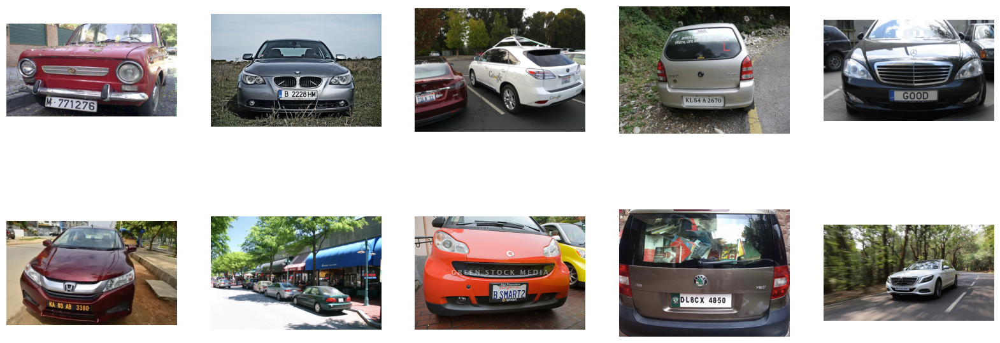

In [ ]:
directory='/kaggle/input/car-plate-detection/images'
plt.figure(figsize=(20, 20))
for i, file in enumerate(os.listdir(directory)[0:10]):
    fullpath = directory + "/" + file
    img=mpimg.imread(fullpath)
    ax=plt.subplot(5,5,i+1)
    plt.axis('off')
    plt.imshow(img)

# Plot image with bounding box

In [ ]:
def plot_with_bounding_box(img_path, bboxes, bb_format):
    fig = plt.figure()
    ax = fig.add_axes([0, 0, 1, 1])
    image = plt.imread(img_path)
    plt.imshow(image)
    for i, bbox in enumerate(bboxes):
        if bb_format == "xywh":
            xc, yc, w, h = bbox
            xmin = xc - (w/2)
            ymin = yc - (h/2)
        else:
            xmin, ymin, xmax, ymax = bbox
            w = xmax - xmin
            h = ymax - ymin
        box = patches.Rectangle((xmin, ymin), w, h, edgecolor="red", facecolor="none")
        ax.add_patch(box)
    plt.axis('off')            

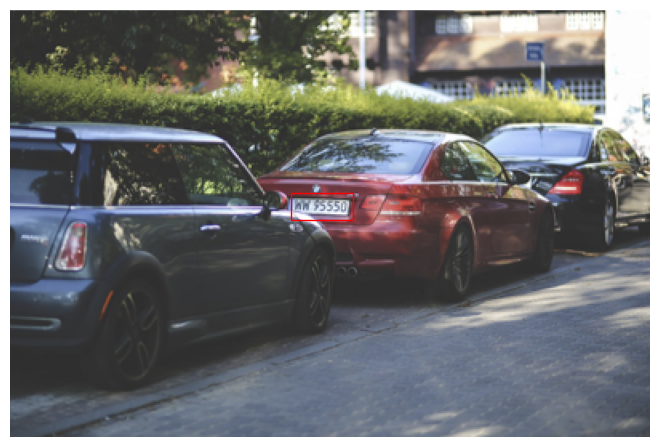

In [ ]:
plot_with_bounding_box("/kaggle/input/car-plate-detection/images/Cars100.png", [[194.5,122.5,39,17]], "xywh" )

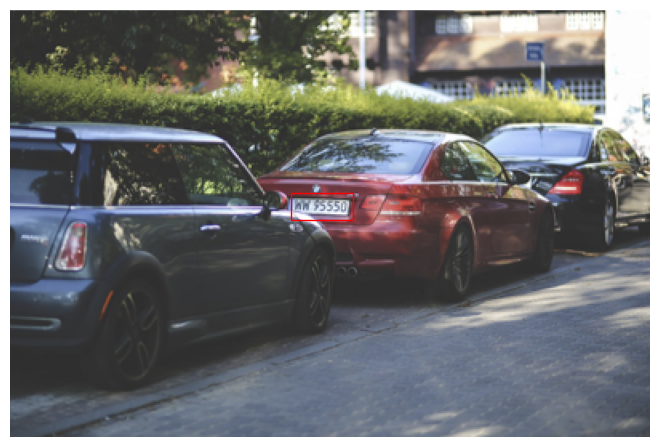

In [ ]:
plot_with_bounding_box("/kaggle/input/car-plate-detection/images/Cars100.png", [[175,114,214,131]], "xyxy" )

In [ ]:
all_images = glob.glob('/kaggle/input/car-plate-detection/images/*.png')
all_anns = glob.glob('/kaggle/input/car-plate-detection/annotations/*.xml')


# Create Folders in the format YOLO expects

In [ ]:
os.mkdir('/kaggle/working/Licence-Plate')
os.mkdir('/kaggle/working/Licence-Plate/train')
os.mkdir('/kaggle/working/Licence-Plate/train/images')
os.mkdir('/kaggle/working/Licence-Plate/train/labels')

os.mkdir('/kaggle/working/Licence-Plate/test')
os.mkdir('/kaggle/working/Licence-Plate/test/images')
os.mkdir('/kaggle/working/Licence-Plate/test/labels')


# Convert bounding box to YOLO bounding box format - xyxy to xcentre,ycentre,w,h

In [ ]:
def bounding_box_in_yolo_format(x1, y1, x2, y2, w, h):
    x1_new = x1/w
    x2_new = x2/w
    y1_new = y1/h
    y2_new = y2/h
    width_bbox = x2_new - x1_new
    height_bbox = y2_new - y1_new
    x = x1_new + (width_bbox/2)
    y = y1_new + (height_bbox/2)
    return x, y, width_bbox, height_bbox

# Process annnotation file to get bottom left(x,y), top right(x,y), width and height

In [ ]:
def process_anns_file(ann_file):
    doc = etree.parse(ann_file)
    x1 = doc.find('.//xmin').text
    y1 = doc.find('.//ymin').text
    x2 = doc.find('.//xmax').text
    y2 = doc.find('.//ymax').text
    w = doc.find('.//width').text
    h = doc.find('.//height').text
    return int(x1),int(y1),int(x2),int(y2),int(w),int(h)

In [ ]:
process_anns_file("/kaggle/input/car-plate-detection/annotations/Cars0.xml")

(226, 125, 419, 173, 500, 268)

In [ ]:
bounding_box_in_yolo_format(134, 128, 262, 160, 400, 248)

(0.495, 0.5806451612903225, 0.32, 0.12903225806451613)

# Generate index - 0 to images count and then split 80/20 as train/test and fetch corresponding images

In [ ]:
count = list(range(0, len(all_images)))
shuffle(count)
train = count[:int(len(all_images)*0.8)]
test = count[int(len(all_images)*0.8):]
print(len(train), len(test), len(count))

346 87 433


# Copying dataset comprising images and label to YOLO format folder
<pre>
    1. Copy images to /trian/images & /test/images according to the indexes in train & test list
    2. for the images, read corresponding annotation file and convert the bounding box co-ordinates to xcentre, ycentre, width & height format and persist into the /train/labels & /test/labels folder
</pre>

In [ ]:
for i in sorted(train):
    shutil.copy("/kaggle/input/car-plate-detection/images/Cars{}.png".format(i), "/kaggle/working/Licence-Plate/train/images/")
    x1,y1,x2,y2,w,h = process_anns_file("/kaggle/input/car-plate-detection/annotations/Cars{}.xml".format(i))
    x1,y1,w,h = bounding_box_in_yolo_format(x1,y1,x2,y2,w,h)
    with open("/kaggle/working/Licence-Plate/train/labels/Cars{}.txt".format(i), "w") as file:
        file.write("0 {} {} {} {}".format(x1, y1, w, h))

In [ ]:
for i in sorted(test):
    shutil.copy("/kaggle/input/car-plate-detection/images/Cars{}.png".format(i), "/kaggle/working/Licence-Plate/test/images/")
    x1,y1,x2,y2,w,h = process_anns_file("/kaggle/input/car-plate-detection/annotations/Cars{}.xml".format(i))
    x1,y1,w,h = bounding_box_in_yolo_format(x1,y1,x2,y2,w,h)
    with open("/kaggle/working/Licence-Plate/test/labels/Cars{}.txt".format(i), "w") as file:
        file.write("0 {} {} {} {}".format(x1, y1, w, h))

In [ ]:
data = dict(
    train= '/kaggle/working/Licence-Plate/train',
    val='/kaggle/working/Licence-Plate/test',
    nc=1,
    names={0: "car_licence_plate"}
)

In [ ]:
with open("/kaggle/working/Licence-Plate/data.yaml", "w") as ymlfile:
    yaml.dump(data, ymlfile, default_flow_style=False)

In [ ]:
!wandb off

W&B offline. Running your script from this directory will only write metadata locally. Use wandb disabled to completely turn off W&B.


# Training for 60 epochs on custom dataset

In [ ]:
!yolo task=detect mode=train data=/kaggle/working/Licence-Plate/data.yaml model=yolov8s.pt epochs=60 imgsz=640 plots=True

100%|███████████████████████████████████████| 21.5M/21.5M [00:00<00:00, 226MB/s]
Ultralytics 8.3.47 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/Licence-Plate/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=F

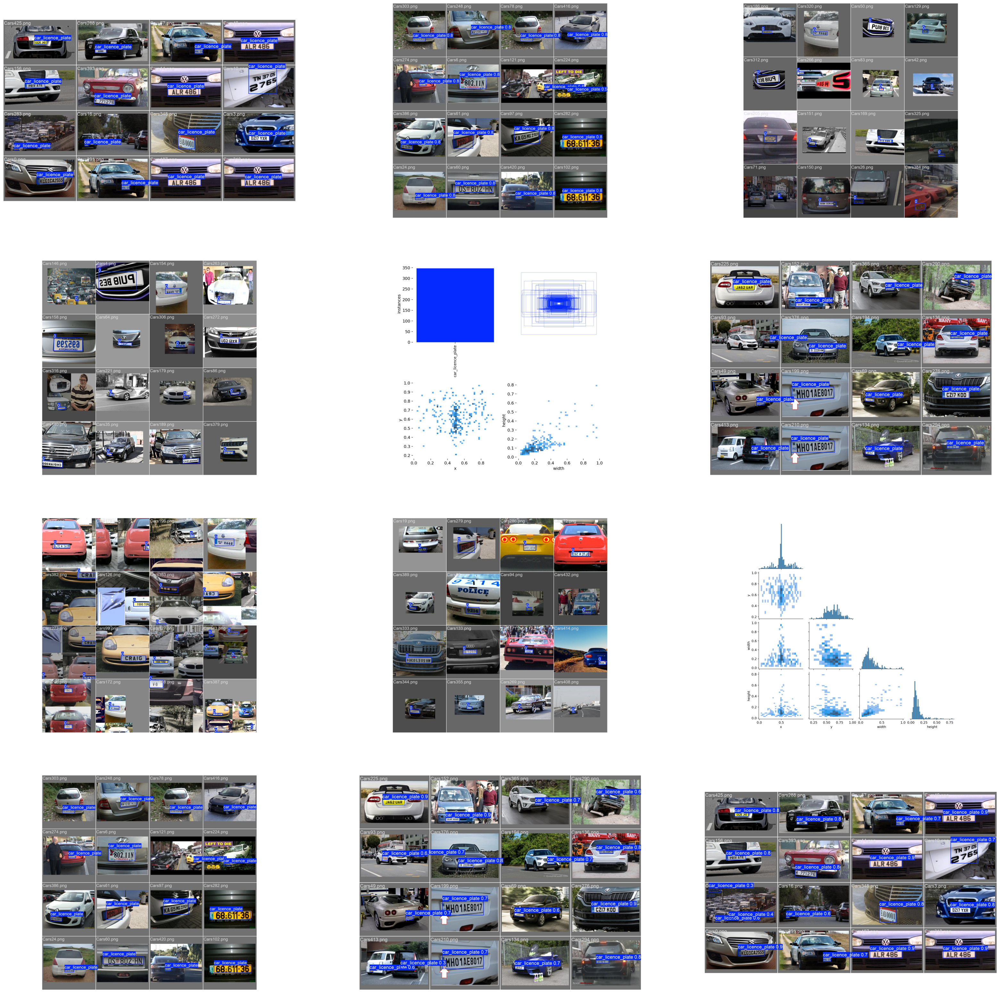

In [ ]:
directory='/kaggle/working/runs/detect/train'
plt.figure(figsize=(40, 40))
for i, file in enumerate(glob.glob(directory+"/*.jpg")[0:12]):
    fullpath = file
    img=mpimg.imread(fullpath)
    ax=plt.subplot(4,3,i+1)
    plt.axis('off')
    plt.imshow(img)

In [ ]:
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

In [ ]:
def predict_bounding_box(img):
    bbox = []
    results = model.predict(img)
    for res in results:
        boxes = res.boxes
        for box in boxes:
            b = box.xyxy.tolist()[0]
            bbox.append([int(b[0]),int(b[1]),int(b[2]),int(b[3])])
    return bbox[0]

In [ ]:
def crop_licence_plate(bbox, ori_img):
    x1,y1,x2,y2 = bbox
    im = ori_img[y1:y2,x1:x2]
    return im

# Read Licence Plate using easyocr
<pre>
    Steps:
    1. read the image
    2. predict the bounding box of the licence plate in the image using the YOLO trained weight
    3. crop the licence plate and present it to easy ocr to output the Licence plate number
</pre>


image 1/1 /kaggle/input/car-plate-detection/images/Cars3.png: 384x640 1 car_licence_plate, 48.0ms
Speed: 4.3ms preprocess, 48.0ms inference, 153.7ms postprocess per image at shape (1, 3, 384, 640)
Licence Plate:DZI7 YXR


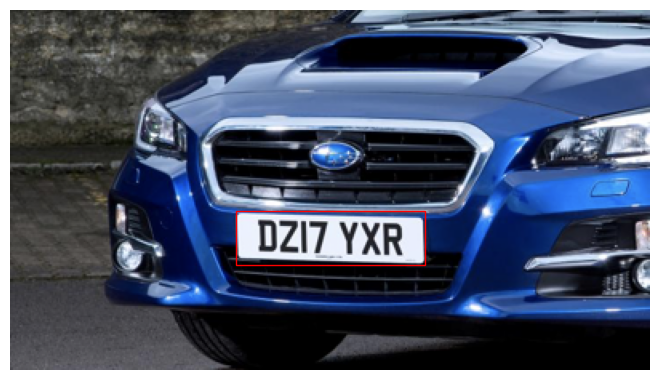

In [ ]:
import cv2
import easyocr

reader = easyocr.Reader(['en'])
image_filename = '/kaggle/input/car-plate-detection/images/Cars3.png'
img = cv2.imread(image_filename)
bbox = predict_bounding_box(image_filename)
im = crop_licence_plate(bbox, img)
# run OCR
results = reader.readtext(im)
lp = []
for res in results:
    lp.append(res[1])
print("Licence Plate:{}".format(''.join(lp)))
plot_with_bounding_box(image_filename, [bbox], "xyxy" )